# MANUAL NET ARCHITECTURE

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import glob
import numpy as np

from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.models import Sequential
from PIL import Image

from tensorflow.keras.layers import Convolution2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Activation

from keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt

In [3]:

Cyst = 'DATASET/TRAIN/Cyst'
Normal = 'DATASET/TRAIN/Normal'
Stone = 'DATASET/TRAIN/Stone'
Tumor = 'DATASET/TRAIN/Tumor'


In [4]:
def plot_images(item_dir, n=6):
    all_item_dir = os.listdir(item_dir)
    item_files = [os.path.join(item_dir, file) for file in all_item_dir][:n]
    
    plt.figure(figsize=(80, 40))
    for idx, img_path in enumerate(item_files):
        plt.subplot(3, n, idx+1)
        img = plt.imread(img_path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    
def image_details_print(data,path):
    print('======== Images in: ', path)
    for key,values in data.items():
        print(key,':\t', values)


def images_details(path):
    files=[f for f in glob.glob(path + "**/*.*", recursive=True)]
    data={}
    data['Images_count']=len(files)
    data['Min_width']=10**100
    data['Max_width']=0
    data['Min_height']=10**100
    data['Max_height']=0
    
    for f in files:
        img=Image.open(f)
        width,height=img.size
        data['Min_width']=min(width,data['Min_width'])
        data['Max_width']=max(width, data['Max_width'])
        data['Min_height']=min(height, data['Min_height'])
        data['Max_height']=max(height, data['Max_height'])
        
    image_details_print(data,path)


TRAINING DATA FOR Cyst:

======== Images in:  DATASET/TRAIN/Cyst
Images_count :	 1155
Min_width :	 512
Max_width :	 947
Min_height :	 476
Max_height :	 765



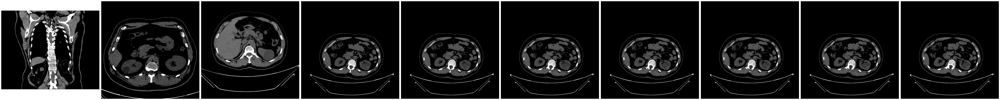

In [5]:
print("")
print("TRAINING DATA FOR Cyst:")
print("")
images_details(Cyst)
print("")
plot_images(Cyst, 10) 


TRAINING DATA FOR Normal:

======== Images in:  DATASET/TRAIN/Normal
Images_count :	 1012
Min_width :	 512
Max_width :	 787
Min_height :	 512
Max_height :	 636



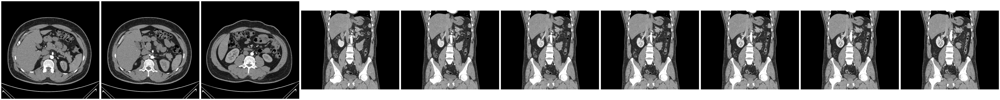

In [6]:
print("")
print("TRAINING DATA FOR Normal:")
print("")
images_details(Normal)
print("")
plot_images(Normal, 10)


TRAINING DATA FOR Stone:

======== Images in:  DATASET/TRAIN/Stone
Images_count :	 1056
Min_width :	 512
Max_width :	 1371
Min_height :	 512
Max_height :	 1110



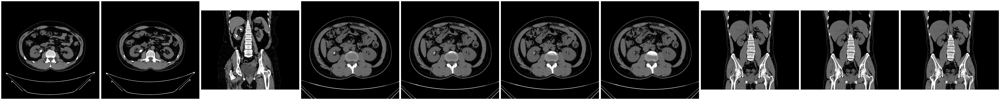

In [7]:
print("")
print("TRAINING DATA FOR Stone:")
print("")
images_details(Stone)
print("")
plot_images(Stone, 10)


TRAINING DATA FOR Tumor:

======== Images in:  DATASET/TRAIN/Tumor
Images_count :	 1012
Min_width :	 512
Max_width :	 910
Min_height :	 512
Max_height :	 737



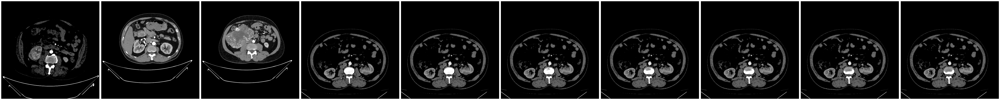

In [8]:
print("")
print("TRAINING DATA FOR Tumor:")
print("")
images_details(Tumor)
print("")
plot_images(Tumor, 10)

In [9]:
train_datagen=ImageDataGenerator(rescale=1./255,shear_range=0.2,zoom_range=0.2,horizontal_flip=True)
training_set=train_datagen.flow_from_directory('dataset/train',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 4235 images belonging to 4 classes.


In [10]:
test_datagen=ImageDataGenerator(rescale=1./255)
test_set=test_datagen.flow_from_directory('dataset/test',target_size=(224,224),batch_size=32,class_mode='categorical')

Found 1096 images belonging to 4 classes.


In [11]:
Classifier=Sequential()
Classifier.add(Convolution2D(32,(3,3),input_shape=(224,224,3),activation='relu'))
Classifier.add(MaxPooling2D(pool_size=(2,2)))
Classifier.add(Flatten())
Classifier.add(Dense(38, activation='relu'))
Classifier.add(Dense(4, activation='softmax'))
Classifier.compile(optimizer='rmsprop',loss='categorical_crossentropy',metrics=['accuracy'])

In [12]:
model_path = "MANUAL.h5"

callbacks = [
    ModelCheckpoint(model_path, monitor='accuracy', verbose=1, save_best_only=True)
]

In [13]:
epochs = 50
batch_size = 512

In [14]:
#### Fitting the model
history = Classifier.fit(
           training_set, steps_per_epoch=training_set.samples // batch_size, 
           epochs=epochs, 
           validation_data=test_set,validation_steps=test_set.samples // batch_size,
           callbacks=callbacks)

Epoch 1/50
8/8 [==============================] - ETA: 0s - loss: 10.6356 - accuracy: 0.2461
Epoch 1: accuracy improved from -inf to 0.24609, saving model to MANUAL.h5
8/8 [==============================] - 24s 3s/step - loss: 10.6356 - accuracy: 0.2461 - val_loss: 2.8705 - val_accuracy: 0.4062
Epoch 2/50
8/8 [==============================] - ETA: 0s - loss: 1.8120 - accuracy: 0.4297
Epoch 2: accuracy improved from 0.24609 to 0.42969, saving model to MANUAL.h5
8/8 [==============================] - 20s 2s/step - loss: 1.8120 - accuracy: 0.4297 - val_loss: 1.5971 - val_accuracy: 0.5469
Epoch 3/50
8/8 [==============================] - ETA: 0s - loss: 1.3571 - accuracy: 0.4883
Epoch 3: accuracy improved from 0.42969 to 0.48828, saving model to MANUAL.h5
8/8 [==============================] - 17s 2s/step - loss: 1.3571 - accuracy: 0.4883 - val_loss: 1.7396 - val_accuracy: 0.3750
Epoch 4/50
8/8 [==============================] - ETA: 0s - loss: 1.1303 - accuracy: 0.5469
Epoch 4: accuracy 

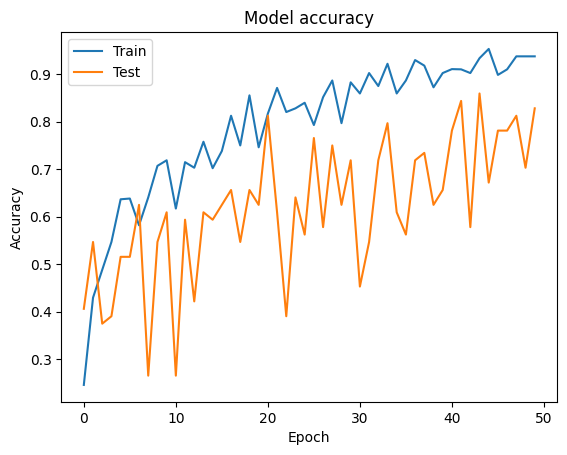

In [15]:
import matplotlib.pyplot as plt

def graph():
    #Plot training & validation accuracy values
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()

graph()

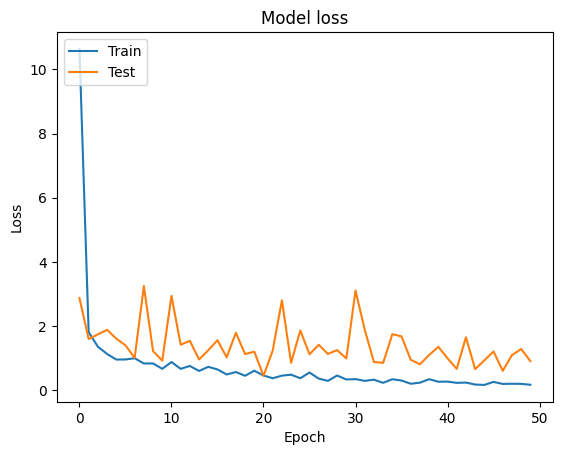

In [16]:
import matplotlib.pyplot as plt

def graph():
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()
graph()